# Artist Identification

### Please Refer to Trial 4 (Final Version of the Model)
Trial 1-3:
- Experimented with different transfer learning approaches to artist identification.
- Explored various architectures and fine-tuning strategies.


### Trial 4 (Final Model):
- Architecture: Pre-trained ResNet50 with fine-tuning of shallow layers.
- Data Handling: Applied class weighting to address imbalance (e.g., Van Gogh vs. Marc Chagall) and used controlled data augmentation.
- Performance: Achieved high training accuracy and robust validation performance.
 

In [5]:
#!pip install tensorflow

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import os
from tqdm import tqdm, tqdm_notebook
import random
import kagglehub
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.initializers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from numpy.random import seed
seed(1)
import tensorflow as tf
tf.random.set_seed(1)
from PIL import Image
import shutil
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras import models, layers


### Load the Data

In [2]:
# Download latest version
path = kagglehub.dataset_download("ikarus777/best-artworks-of-all-time")

print("Path to dataset files:", path)

Path to dataset files: /Users/kavyaemani/.cache/kagglehub/datasets/ikarus777/best-artworks-of-all-time/versions/1


In [3]:
# List files in the dataset directory
files = os.listdir(path)
print("Files in dataset:", files)

Files in dataset: ['resized', 'images', 'artists.csv']


Total images found: 8683
First 5 image filenames: ['/Users/kavyaemani/.cache/kagglehub/datasets/ikarus777/best-artworks-of-all-time/versions/1/resized/resized/Piet_Mondrian/Piet_Mondrian_38.jpg', '/Users/kavyaemani/.cache/kagglehub/datasets/ikarus777/best-artworks-of-all-time/versions/1/resized/resized/Piet_Mondrian/Piet_Mondrian_10.jpg', '/Users/kavyaemani/.cache/kagglehub/datasets/ikarus777/best-artworks-of-all-time/versions/1/resized/resized/Piet_Mondrian/Piet_Mondrian_11.jpg', '/Users/kavyaemani/.cache/kagglehub/datasets/ikarus777/best-artworks-of-all-time/versions/1/resized/resized/Piet_Mondrian/Piet_Mondrian_39.jpg', '/Users/kavyaemani/.cache/kagglehub/datasets/ikarus777/best-artworks-of-all-time/versions/1/resized/resized/Piet_Mondrian/Piet_Mondrian_13.jpg']


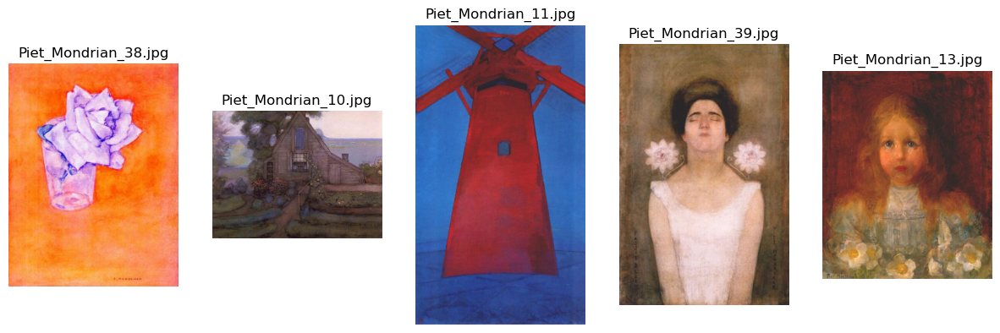

In [4]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to the subdirectory containing the images
subdirectory = os.path.join(path, 'resized', 'resized')

# Recursively collect all image file paths (allowed formats)
allowed_formats = ('.bmp', '.gif', '.jpeg', '.jpg', '.png')
image_paths = []
for root, dirs, files in os.walk(subdirectory):
    for file in files:
        if file.lower().endswith(allowed_formats):
            image_paths.append(os.path.join(root, file))

print("Total images found:", len(image_paths))
print("First 5 image filenames:", image_paths[:5])

# Display the first 5 images
num_images = 5
plt.figure(figsize=(15, 5))
for i in range(num_images):
    img = Image.open(image_paths[i])
    plt.subplot(1, num_images, i + 1)
    plt.imshow(img)
    plt.title(os.path.basename(image_paths[i]))
    plt.axis('off')
plt.show()


In [5]:
csv_file = os.path.join(path, "artists.csv")
df = pd.read_csv(csv_file)
print(df.head())

   id                name        years                         genre  \
0   0   Amedeo Modigliani  1884 - 1920                 Expressionism   
1   1  Vasiliy Kandinskiy  1866 - 1944  Expressionism,Abstractionism   
2   2        Diego Rivera  1886 - 1957       Social Realism,Muralism   
3   3        Claude Monet  1840 - 1926                 Impressionism   
4   4       Rene Magritte  1898 - 1967      Surrealism,Impressionism   

  nationality                                                bio  \
0     Italian  Amedeo Clemente Modigliani (Italian pronunciat...   
1     Russian  Wassily Wassilyevich Kandinsky (Russian: Васи́...   
2     Mexican  Diego María de la Concepción Juan Nepomuceno E...   
3      French  Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...   
4     Belgian  René François Ghislain Magritte (French: [ʁəne...   

                                        wikipedia  paintings  
0  http://en.wikipedia.org/wiki/Amedeo_Modigliani        193  
1  http://en.wikipedia.org/wiki/

## Data Preprocessing

In [6]:
# How many unique artists are present?
print("Total unique artists:", df["name"].nunique())

Total unique artists: 50


In [7]:
# Which artists have the most paintings
top_artists = df.nlargest(15, "paintings")[['name','genre','paintings']]  
print(top_artists)

                     name                                    genre  paintings
8        Vincent van Gogh                       Post-Impressionism        877
30            Edgar Degas                            Impressionism        702
13          Pablo Picasso                                   Cubism        439
15  Pierre-Auguste Renoir                            Impressionism        336
19         Albrecht Dürer                     Northern Renaissance        328
46           Paul Gauguin             Symbolism,Post-Impressionism        311
16         Francisco Goya                              Romanticism        291
31              Rembrandt                                  Baroque        262
20          Alfred Sisley                            Impressionism        259
32                 Titian               High Renaissance,Mannerism        255
22           Marc Chagall                              Primitivism        239
4           Rene Magritte                 Surrealism,Impressioni

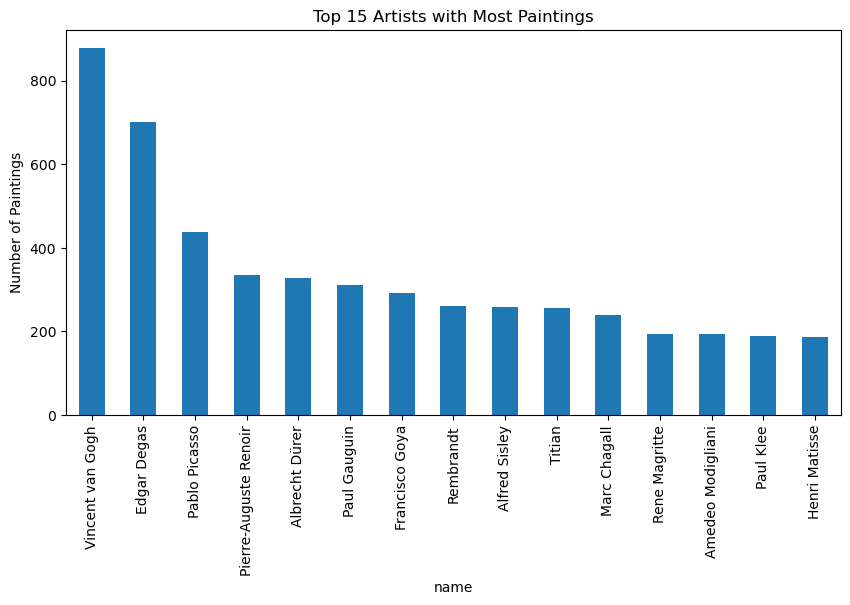

In [8]:
# Bar chart of top 15 artists with the most paintings
top_artists.plot(kind="bar", x="name", y="paintings", figsize=(10, 5), legend=False)
plt.title("Top 15 Artists with Most Paintings")
plt.ylabel("Number of Paintings")
#plt.xticks(rotation=45)
plt.show()

##### Expected Folder structure
resized/resized/
│── Vincent_van_Gogh/
│   ├── Vincent_van_Gogh_001.jpg
│   ├── Vincent_van_Gogh_002.jpg
│── Pablo_Picasso/
│   ├── Pablo_Picasso_001.jpg
│   ├── Pablo_Picasso_002.jpg
│── Leonardo_da_Vinci/
│   ├── Leonardo_da_Vinci_001.jpg
│   ├── Leonardo_da_Vinci_002.jpg

In [9]:
dataset_path = "/Users/kavyaemani/.cache/kagglehub/datasets/ikarus777/best-artworks-of-all-time/versions/1/resized/resized"

# Create subdirectories and move images
for file in os.listdir(dataset_path):
    if file.endswith(('.jpg', '.jpeg', '.png')):  # Ensure it's an image file
        artist_name = file.rsplit("_", 1)[0]  # Extract artist name from filename
        artist_dir = os.path.join(dataset_path, artist_name)  # Create folder per artist

        # Create artist folder if it doesn’t exist
        os.makedirs(artist_dir, exist_ok=True)

        # Move image into the respective artist folder
        shutil.move(os.path.join(dataset_path, file), os.path.join(artist_dir, file))

print("Images successfully organized into subdirectories!")

Images successfully organized into subdirectories!


In [11]:
# Normalize and Resize Images:Resize images to 224×224  ; Normalize pixel values to [0,1] (by dividing by 255)
img_height, img_width = 224, 224
batch_size = 32

# Load dataset and split into training & validation sets
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    subdirectory,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    subdirectory,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)
class_names = train_ds.class_names
print("Class Names:",class_names)

Found 8683 files belonging to 51 classes.
Using 6947 files for training.
Found 8683 files belonging to 51 classes.
Using 1736 files for validation.
Class Names: ['Albrecht_DuΓòá├¬rer', 'Albrecht_Du╠êrer', 'Alfred_Sisley', 'Amedeo_Modigliani', 'Andrei_Rublev', 'Andy_Warhol', 'Camille_Pissarro', 'Caravaggio', 'Claude_Monet', 'Diego_Rivera', 'Diego_Velazquez', 'Edgar_Degas', 'Edouard_Manet', 'Edvard_Munch', 'El_Greco', 'Eugene_Delacroix', 'Francisco_Goya', 'Frida_Kahlo', 'Georges_Seurat', 'Giotto_di_Bondone', 'Gustav_Klimt', 'Gustave_Courbet', 'Henri_Matisse', 'Henri_Rousseau', 'Henri_de_Toulouse-Lautrec', 'Hieronymus_Bosch', 'Jackson_Pollock', 'Jan_van_Eyck', 'Joan_Miro', 'Kazimir_Malevich', 'Leonardo_da_Vinci', 'Marc_Chagall', 'Michelangelo', 'Mikhail_Vrubel', 'Pablo_Picasso', 'Paul_Cezanne', 'Paul_Gauguin', 'Paul_Klee', 'Peter_Paul_Rubens', 'Pierre-Auguste_Renoir', 'Piet_Mondrian', 'Pieter_Bruegel', 'Raphael', 'Rembrandt', 'Rene_Magritte', 'Salvador_Dali', 'Sandro_Botticelli', 'Titian'

In [12]:
# Normalize the images (scale pixel values to [0,1])
normalization_layer = layers.Rescaling(1./255)

# Apply normalization to training and validation datasets
train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
val_ds = val_ds.map(lambda x, y: (normalization_layer(x), y))

print("Images successfully loaded, resized, and normalized!")

Images successfully loaded, resized, and normalized!


### Data Augmentaion

In [13]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),  # Flip images randomly
    layers.RandomRotation(0.2),  # Rotate by 20%
    layers.RandomZoom(0.2),  # Zoom-in and out
    layers.RandomContrast(0.2)  # Slight contrast variations
])

# Apply data augmentation to training dataset
train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

print("Data augmentation applied to training dataset!")

Data augmentation applied to training dataset!


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0238788].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09542486..1.0089768].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0368865].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0890268].


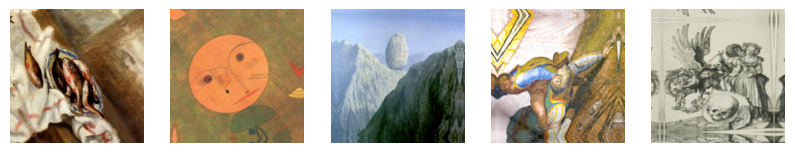

2025-03-09 01:09:43.032615: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [14]:
# Display augmented images
plt.figure(figsize=(10, 5))

for images, labels in train_ds.take(1):  # Take one batch of images
    for i in range(5):  # Show first 5 images
        plt.subplot(1, 5, i+1)
        plt.imshow(images[i].numpy())  # Convert tensor to image
        plt.axis("off")
    plt.show()

In [15]:
# Load Pre-trained VGG16 model (without top classifier layers)
base_model = VGG16(input_shape=(224, 224, 3),  # Image size (same as in preprocessing)
                   include_top=False,  # Remove final classification layers
                   weights='imagenet')

# Freeze the base model's layers so they are not updated during training
base_model.trainable = False

# Build the classification model
model = models.Sequential([
    base_model,                      # Pretrained VGG16 base
    layers.GlobalAveragePooling2D(),  # Convert feature maps to vector
    layers.Dense(128, activation='relu'),  # Fully connected layer
    layers.Dropout(0.5),              # Dropout for regularization
    layers.Dense(len(class_names), activation='softmax')  # Output layer (Artist Classes)
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Display model summary
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 51)             │         6,579 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,786,931 (56.41 MB)

 Trainable params: 72,243 (282.20 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

##### The model has 14.78M total parameters, but only 72K are trainable, meaning it mainly leverages VGG16's pretrained knowledge while fine-tuning just the top layers for classification.

In [16]:
# Train the CNN model
epochs = 10  # We can increase epochs for better results
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)

Epoch 1/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 477s 2s/step - accuracy: 0.0975 - loss: 3.7248 - val_accuracy: 0.1959 - val_loss: 3.2512
Epoch 2/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 469s 2s/step - accuracy: 0.1724 - loss: 3.2528 - val_accuracy: 0.2414 - val_loss: 2.9711
Epoch 3/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 480s 2s/step - accuracy: 0.2166 - loss: 3.0263 - val_accuracy: 0.2725 - val_loss: 2.8082
Epoch 4/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 474s 2s/step - accuracy: 0.2344 - loss: 2.8890 - val_accuracy: 0.2909 - val_loss: 2.6892
Epoch 5/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 469s 2s/step - accuracy: 0.2620 - loss: 2.7759 - val_accuracy: 0.2886 - val_loss: 2.6114
Epoch 6/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 470s 2s/step - accuracy: 0.2844 - loss: 2.6938 - val_accuracy: 0.3099 - val_loss: 2.5334
Epoch 7/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 468s 2s/step - accuracy: 0.2892 - loss: 2.6467 - val_accuracy: 0.3157 - val_loss: 2.4958
Epoch 8/10
218/218 ━━━━━━━━━━━━━━━━━━━━ 477s 2s/step - accuracy: 0.3007 - loss: 2.5894 - val_accu

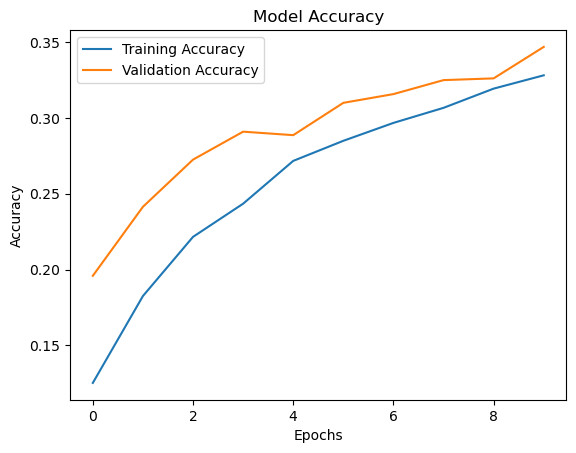

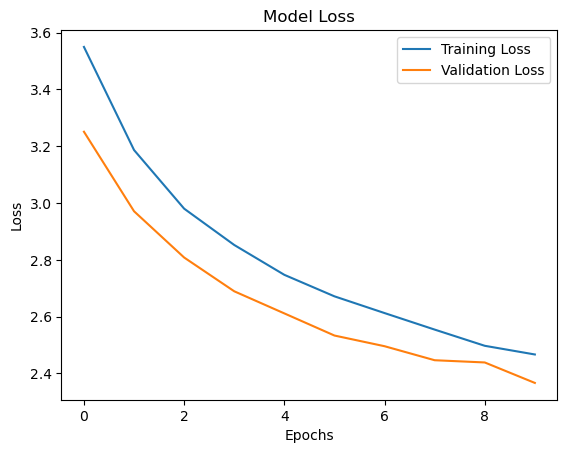

In [18]:
# Evaluate the Model
plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.title("Model Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

# Plot Loss
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.title("Model Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [25]:
# Evaluate on validation dataset (val_ds)
val_loss, val_acc = model.evaluate(val_ds)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

55/55 ━━━━━━━━━━━━━━━━━━━━ 94s 2s/step - accuracy: 0.3534 - loss: 2.3594
Validation Accuracy: 0.3468
Validation Loss: 2.3665


##### Both training and validation accuracy improve consistently over epochs.
##### Final validation accuracy (~35.9%) shows that the model is improving but still has room for enhancement.
##### Training and validation loss steadily decrease, indicating that the model is learning.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


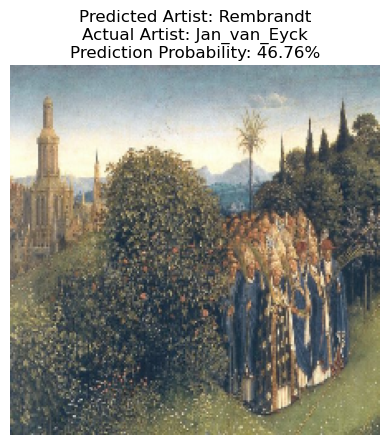

In [24]:
import numpy as np
import matplotlib.pyplot as plt

# Take one image from validation dataset
for images, labels in val_ds.take(1):  
    image = images[0].numpy()  # Convert tensor to NumPy array
    true_label = labels[0].numpy()  # Get the actual artist label

    # Expand dimensions (convert to batch format)
    img_array = np.expand_dims(image, axis=0)

    # Normalize the image manually (same as training)
    img_array = img_array / 255.0  

    # Predict artist
    predictions = model.predict(img_array)
    predicted_label = np.argmax(predictions)  # Get the index of the highest probability

    # Get prediction probability (confidence score)
    prediction_prob = np.max(predictions) * 100  # Convert to percentage

    # Display result
    plt.imshow(image)
    plt.title(f"Predicted Artist: {class_names[predicted_label]}\n"
              f"Actual Artist: {class_names[true_label]}\n"
              f"Prediction Probability: {prediction_prob:.2f}%")
    plt.axis("off")
    plt.show()


# Trial 2

In [28]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models
from sklearn.utils.class_weight import compute_class_weight

### Load and Preprocess

In [29]:
# Get current working directory
cwd = os.getcwd()
print("Current Directory:", cwd)

# List all files and folders in the working directory
print("Contents:", os.listdir(cwd))

Current Directory: /Users/kavyaemani/Winter_2025/Deep Learning/Project
Contents: ['resized', '.DS_Store', 'Artist identification updated.ipynb', 'Artist identification updated copy.ipynb', 'DL-Artist_Identifier project outline.docx', 'filtered_resized', 'artists.csv', '.ipynb_checkpoints']


In [30]:
# Path to dataset
data_dir = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/resized"
csv_file = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/artists.csv"

In [31]:
# Path to dataset
data_dir = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/resized"
csv_file = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/artists.csv"

# Load artist data
df = pd.read_csv(csv_file)

# Select top 11 artists (with >200 paintings)
top_artists = df[df['paintings'] > 200]['name'].str.replace(' ', '_').tolist()
print("Top 11 Artists:", top_artists)

# Ensure only selected artist folders are used
data_dir_filtered = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/filtered_resized"

# Create a filtered dataset directory
if not os.path.exists(data_dir_filtered):
    os.makedirs(data_dir_filtered)

# Move images of only top 11 artists
for artist in top_artists:
    src_path = os.path.join(data_dir, artist)
    dst_path = os.path.join(data_dir_filtered, artist)

    if os.path.exists(src_path):
        if not os.path.exists(dst_path):
            shutil.copytree(src_path, dst_path)  # Copy images to filtered directory
print(" Dataset filtered to top 11 artists.")


Top 11 Artists: ['Vincent_van_Gogh', 'Pablo_Picasso', 'Pierre-Auguste_Renoir', 'Francisco_Goya', 'Albrecht_Dürer', 'Alfred_Sisley', 'Marc_Chagall', 'Edgar_Degas', 'Rembrandt', 'Titian', 'Paul_Gauguin']
 Dataset filtered to top 11 artists.


In [34]:
train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_filtered,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(224, 224),
    batch_size=32
)

val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_filtered,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(224, 224),
    batch_size=32
)

# Then you can apply normalization and augmentation mapping
normalization_layer = layers.Rescaling(1./255)
train_ds = train_ds_raw.map(lambda x, y: (normalization_layer(x), y))
val_ds = val_ds_raw.map(lambda x, y: (normalization_layer(x), y))

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
    layers.RandomBrightness(0.2),
    layers.RandomTranslation(0.2, 0.2)
])

train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))


Found 4299 files belonging to 11 classes.
Using 3440 files for training.
Found 4299 files belonging to 11 classes.
Using 859 files for validation.


In [35]:
# Normalize images (scale pixel values to [0,1])
normalization_layer = layers.Rescaling(1./255)

# Apply normalization
train_ds = train_ds_raw.map(lambda x, y: (normalization_layer(x), y))
val_ds = val_ds_raw.map(lambda x, y: (normalization_layer(x), y))

# Apply Data Augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
    layers.RandomBrightness(0.2),
    layers.RandomTranslation(0.2, 0.2)
])

# Apply augmentation to training dataset
train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

print(" Images successfully loaded, resized, normalized, and augmented!")


 Images successfully loaded, resized, normalized, and augmented!


In [36]:
# Extract labels from training data
train_labels = train_generator.classes

# Compute class weights
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_labels),
    y=train_labels
)

# Convert class weights to dictionary format
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
print("Computed Class Weights:", class_weight_dict)


Computed Class Weights: {0: 1.1904597303836848, 1: 1.5052447552447552, 2: 0.5571012617275962, 3: 1.3437378072571207, 4: 1.6306818181818181, 5: 0.8894628099173554, 6: 1.257393209200438, 7: 1.1639067252450153, 8: 1.490909090909091, 9: 1.53475935828877, 10: 0.445998445998446}


In [37]:
# Load Pre-trained ResNet50 model (without classifier layers)
base_model = ResNet50(input_shape=(224, 224, 3),
                      include_top=False,
                      weights='imagenet')

# ✅ Keep shallow layers trainable to learn painting style
for layer in base_model.layers[:50]:  # Freeze deeper layers
    layer.trainable = False
for layer in base_model.layers[50:]:  # Fine-tune shallow layers
    layer.trainable = True

# Build model
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(class_names), activation='softmax')  # Output layer
])

# Compile model with lower learning rate for fine-tuning
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 11)             │         2,827 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,115,083 (91.99 MB)

 Trainable params: 23,454,475 (89.47 MB)

 Non-trainable params: 660,608 (2.52 MB)

In [38]:
# Train model with class weights
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,  # More epochs for better training
    class_weight=class_weight_dict,  # Apply class weights
    verbose=1
)

/opt/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 215s 2s/step - accuracy: 0.2240 - loss: 2.2059 - val_accuracy: 0.0819 - val_loss: 2.8876
Epoch 2/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 198s 2s/step - accuracy: 0.4550 - loss: 1.5494 - val_accuracy: 0.1088 - val_loss: 3.5296
Epoch 3/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 203s 2s/step - accuracy: 0.5200 - loss: 1.2996 - val_accuracy: 0.0959 - val_loss: 8.0068
Epoch 4/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 200s 2s/step - accuracy: 0.5851 - loss: 1.1608 - val_accuracy: 0.2257 - val_loss: 3.0981
Epoch 5/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 201s 2s/step - accuracy: 0.6161 - loss: 1.0152 - val_accuracy: 0.2620 - val_loss: 3.3380
Epoch 6/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 202s 2s/step - accuracy: 0.6708 - loss: 0.8677 - val_accuracy: 0.3135 - val_loss: 2.5322
Epoch 7/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 205s 2s/step - accuracy: 0.6785 - loss: 0.8787 - val_accuracy: 0.3135 - val_loss: 2.8570
Epoch 8/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 204s 2s/step - accuracy: 0.7107 - loss: 0.7555 - val_accu

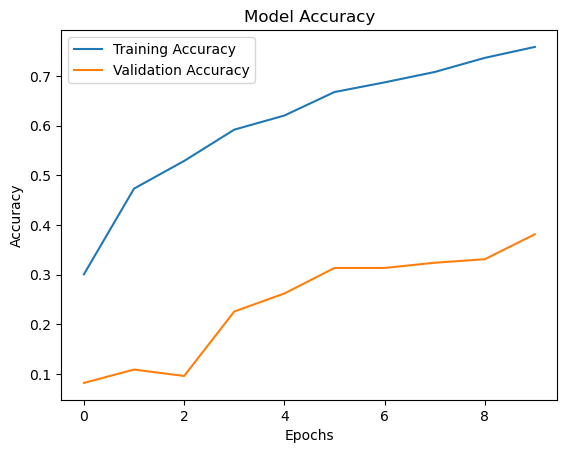

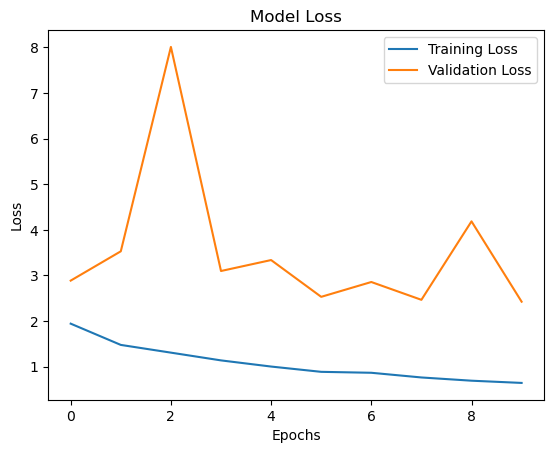

In [39]:
# Plot Accuracy
plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.title("Model Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

# Plot Loss
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.title("Model Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()


In [40]:
# Evaluate the model on the validation dataset
val_loss, val_accuracy = model.evaluate(val_generator, verbose=1)
print(f"Validation Accuracy: {val_accuracy:.4f}")

27/27 ━━━━━━━━━━━━━━━━━━━━ 14s 521ms/step - accuracy: 0.3668 - loss: 2.4534
Validation Accuracy: 0.3813


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


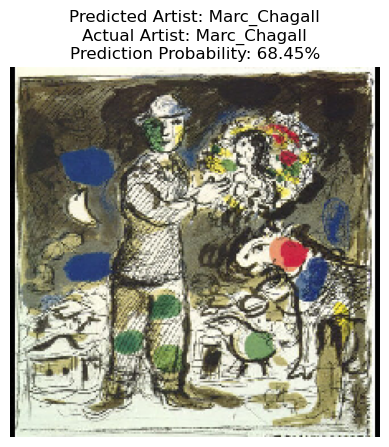

In [40]:
# Take one image from validation dataset
for images, labels in val_generator:
    image = images[0]  # Get first image
    true_label = labels[0]  # Get true artist label

    # Expand dimensions for model input
    img_array = np.expand_dims(image, axis=0)

    # Predict artist
    predictions = model.predict(img_array)
    predicted_label = np.argmax(predictions)  # Get the highest probability class
    prediction_prob = np.max(predictions) * 100  # Convert to percentage

    # Display result
    plt.imshow(image)
    plt.title(f"Predicted Artist: {class_names[predicted_label]}\n"
              f"Actual Artist: {class_names[int(true_label)]}\n"
              f"Prediction Probability: {prediction_prob:.2f}%")
    plt.axis("off")
    plt.show()
    break  # Show one prediction only


## Trial 3:

In [41]:
import os
import numpy as np
import tensorflow as tf
import random
import shutil
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils.class_weight import compute_class_weight


## Load & Filter Dataset for Top 11 Artists

In [42]:
# Define paths
data_dir = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/resized"
csv_file = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/artists.csv"

# Load artist metadata
df = pd.read_csv(csv_file)

# Select top 11 artists with more than 200 paintings
top_artists = df[df['paintings'] > 200]['name'].str.replace(' ', '_').tolist()
print("Selected top 11 artists:", top_artists)

# Create a new directory for filtered dataset
data_dir_filtered = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/filtered_resized"
os.makedirs(data_dir_filtered, exist_ok=True)

# Move images for only the top 11 artists
for artist in top_artists:
    src_path = os.path.join(data_dir, artist)
    dst_path = os.path.join(data_dir_filtered, artist)

    if os.path.exists(src_path) and not os.path.exists(dst_path):
        shutil.copytree(src_path, dst_path)  # Copy images into the filtered dataset

print("Dataset successfully filtered for selected artists.")


Selected top 11 artists: ['Vincent_van_Gogh', 'Pablo_Picasso', 'Pierre-Auguste_Renoir', 'Francisco_Goya', 'Albrecht_Dürer', 'Alfred_Sisley', 'Marc_Chagall', 'Edgar_Degas', 'Rembrandt', 'Titian', 'Paul_Gauguin']
Dataset successfully filtered for selected artists.


## Data Augmentation Using ImageDataGenerator

In [43]:
batch_size = 16
img_size = (224, 224)
input_shape = (224, 224, 3)

train_datagen = ImageDataGenerator(
    validation_split=0.2, 
    rescale=1./255., 
    shear_range=5,  
    horizontal_flip=True,
    vertical_flip=True
)

val_datagen = ImageDataGenerator(
    validation_split=0.2, 
    rescale=1./255.
)

# Load training dataset
train_generator = train_datagen.flow_from_directory(
    data_dir_filtered,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True,
    classes=top_artists
)

# Load validation dataset
valid_generator = val_datagen.flow_from_directory(
    data_dir_filtered,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=True,
    classes=top_artists
)

# Get class labels
class_names = list(train_generator.class_indices.keys())
n_classes = len(class_names)

print(" Class Labels:", class_names)


Found 3444 images belonging to 11 classes.
Found 855 images belonging to 11 classes.
 Class Labels: ['Vincent_van_Gogh', 'Pablo_Picasso', 'Pierre-Auguste_Renoir', 'Francisco_Goya', 'Albrecht_Dürer', 'Alfred_Sisley', 'Marc_Chagall', 'Edgar_Degas', 'Rembrandt', 'Titian', 'Paul_Gauguin']


## Compute Class Weights for Imbalanced Data

In [44]:
# Extract labels from training dataset
train_labels = train_generator.classes

# Compute class weights
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_labels),
    y=train_labels
)

# Convert class weights to dictionary format
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}
print("Computed Class Weights:", class_weight_dict)


Computed Class Weights: {0: 0.445998445998446, 1: 0.8894628099173554, 2: 1.1639067252450153, 3: 1.3437378072571207, 4: 1.1904597303836848, 5: 1.5052447552447552, 6: 1.6306818181818181, 7: 0.5571012617275962, 8: 1.490909090909091, 9: 1.53475935828877, 10: 1.257393209200438}


## Build ResNet50 Model (Fine-Tuned)

In [45]:
# Load pre-trained ResNet50 model
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=input_shape)

# Fine-tune layers
for layer in base_model.layers[:50]:  
    layer.trainable = False  # Freeze deeper layers
for layer in base_model.layers[50:]:  
    layer.trainable = True   # Fine-tune shallow layers

# Add classification layers
X = base_model.output
X = Flatten()(X)

X = Dense(512, kernel_initializer="he_uniform")(X)
X = BatchNormalization()(X)
X = Activation("relu")(X)

X = Dense(16, kernel_initializer="he_uniform")(X)
X = BatchNormalization()(X)
X = Activation("relu")(X)

output = Dense(n_classes, activation="softmax")(X)

# Compile the model
model = Model(inputs=base_model.input, outputs=output)

optimizer = Adam(learning_rate=0.0001)
model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_5[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 74,978,955 (286.02 MB)

 Trainable params: 74,317,291 (283.50 MB)

 Non-trainable params: 661,664 (2.52 MB)

## Train Model with Class Weights

In [46]:
# Callbacks
early_stop = EarlyStopping(monitor="val_loss", patience=20, verbose=1, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=5, verbose=1)

# Train the model
history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=50,
    shuffle=True,
    verbose=1,
    callbacks=[reduce_lr, early_stop],
    class_weight=class_weight_dict
)

/opt/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 246s 1s/step - accuracy: 0.2319 - loss: 2.1993 - val_accuracy: 0.1240 - val_loss: 2.5869 - learning_rate: 1.0000e-04
Epoch 2/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 257s 1s/step - accuracy: 0.3681 - loss: 1.8226 - val_accuracy: 0.2047 - val_loss: 2.3498 - learning_rate: 1.0000e-04
Epoch 3/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 263s 1s/step - accuracy: 0.4758 - loss: 1.6233 - val_accuracy: 0.2023 - val_loss: 2.6355 - learning_rate: 1.0000e-04
Epoch 4/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 252s 1s/step - accuracy: 0.5170 - loss: 1.5226 - val_accuracy: 0.4257 - val_loss: 1.9185 - learning_rate: 1.0000e-04
Epoch 5/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 222s 1s/step - accuracy: 0.5773 - loss: 1.3936 - val_accuracy: 0.3275 - val_loss: 2.2572 - learning_rate: 1.0000e-04
Epoch 6/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 220s 1s/step - accuracy: 0.5993 - loss: 1.3404 - val_accuracy: 0.3719 - val_loss: 2.0939 - learning_rate: 1.0000e-04
Epoch 7/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 223s 1s/step - acc

## Evaluate the Model

In [47]:
# Evaluate on training data
train_score = model.evaluate(train_generator, verbose=1)
print("Train Accuracy:", train_score[1])

# Evaluate on validation data
valid_score = model.evaluate(valid_generator, verbose=1)
print(" Validation Accuracy:", valid_score[1])


216/216 ━━━━━━━━━━━━━━━━━━━━ 63s 289ms/step - accuracy: 0.9976 - loss: 0.0854
Train Accuracy: 0.9973867535591125
54/54 ━━━━━━━━━━━━━━━━━━━━ 15s 285ms/step - accuracy: 0.7805 - loss: 0.7982
 Validation Accuracy: 0.7637426853179932


## Visualize Training Performance

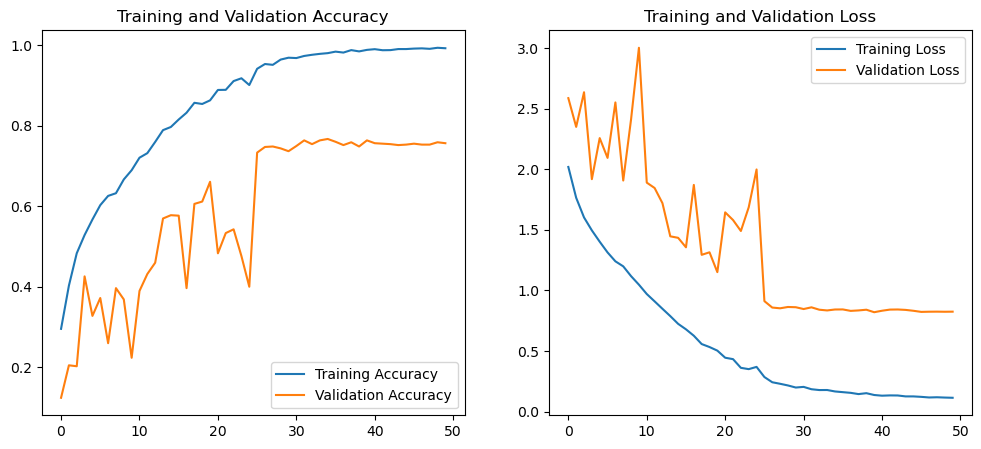

In [48]:
def plot_training(history):
    plt.figure(figsize=(12, 5))

    # Plot Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history["accuracy"], label="Training Accuracy")
    plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
    plt.title("Training and Validation Accuracy")
    plt.legend()

    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history["loss"], label="Training Loss")
    plt.plot(history.history["val_loss"], label="Validation Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    plt.show()

plot_training(history)

## Make Predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 727ms/step


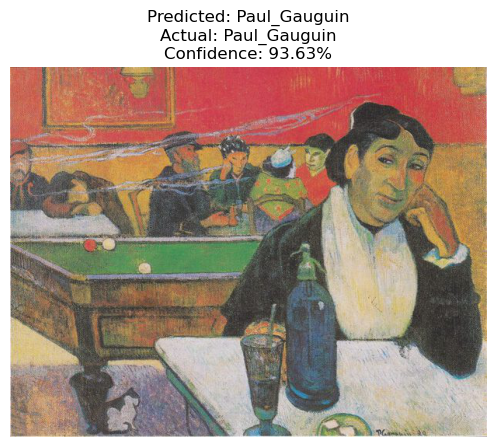

In [49]:
# Select a random image
random_artist = random.choice(class_names)
random_image = random.choice(os.listdir(os.path.join(data_dir_filtered, random_artist)))
random_image_file = os.path.join(data_dir_filtered, random_artist, random_image)

# Load the image
test_image = image.load_img(random_image_file, target_size=img_size)
test_image = image.img_to_array(test_image) / 255.0
test_image = np.expand_dims(test_image, axis=0)

# Predict artist
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.amax(prediction) * 100

# Display image and prediction
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


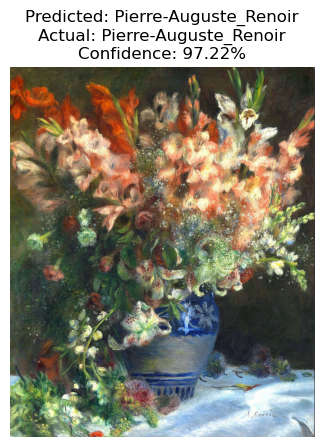

In [51]:
# Select a random image
random_artist = random.choice(class_names)
random_image = random.choice(os.listdir(os.path.join(data_dir_filtered, random_artist)))
random_image_file = os.path.join(data_dir_filtered, random_artist, random_image)

# Load the image
test_image = image.load_img(random_image_file, target_size=img_size)
test_image = image.img_to_array(test_image) / 255.0
test_image = np.expand_dims(test_image, axis=0)

# Predict artist
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.amax(prediction) * 100

# Display image and prediction
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


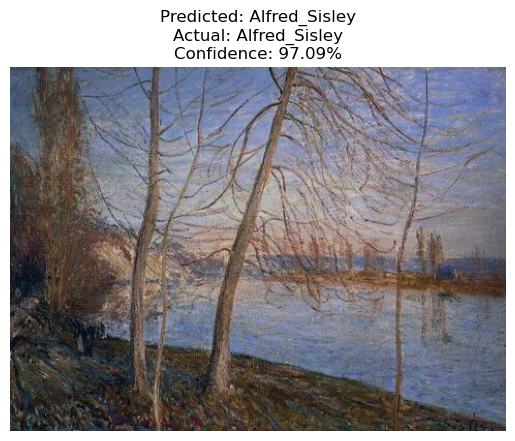

In [52]:
# Select a random image
random_artist = random.choice(class_names)
random_image = random.choice(os.listdir(os.path.join(data_dir_filtered, random_artist)))
random_image_file = os.path.join(data_dir_filtered, random_artist, random_image)

# Load the image
test_image = image.load_img(random_image_file, target_size=img_size)
test_image = image.img_to_array(test_image) / 255.0
test_image = np.expand_dims(test_image, axis=0)

# Predict artist
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.amax(prediction) * 100

# Display image and prediction
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


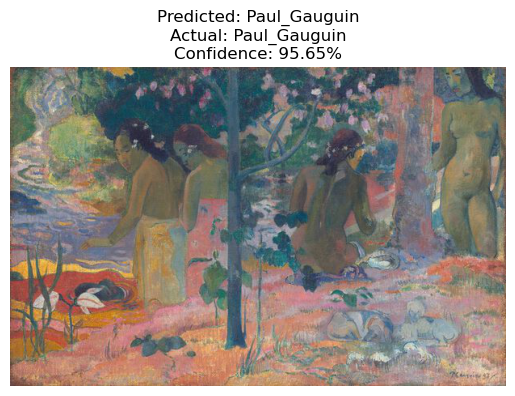

In [53]:
# Select a random image
random_artist = random.choice(class_names)
random_image = random.choice(os.listdir(os.path.join(data_dir_filtered, random_artist)))
random_image_file = os.path.join(data_dir_filtered, random_artist, random_image)

# Load the image
test_image = image.load_img(random_image_file, target_size=img_size)
test_image = image.img_to_array(test_image) / 255.0
test_image = np.expand_dims(test_image, axis=0)

# Predict artist
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.amax(prediction) * 100

# Display image and prediction
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


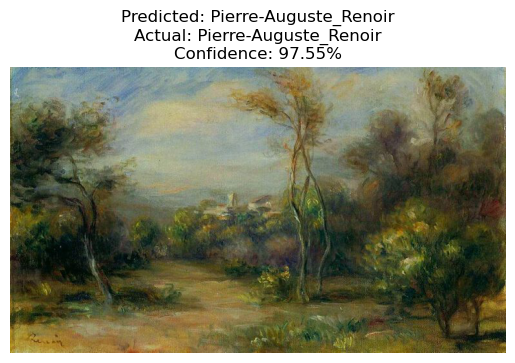

In [54]:
# Select a random image
random_artist = random.choice(class_names)
random_image = random.choice(os.listdir(os.path.join(data_dir_filtered, random_artist)))
random_image_file = os.path.join(data_dir_filtered, random_artist, random_image)

# Load the image
test_image = image.load_img(random_image_file, target_size=img_size)
test_image = image.img_to_array(test_image) / 255.0
test_image = np.expand_dims(test_image, axis=0)

# Predict artist
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.amax(prediction) * 100

# Display image and prediction
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()


# Trial 4 - Final Version

### Approach to solution:
### Data processing:
- There are paintings of 50 artists in the dataset. However only 11 artists have more than 200 paintings available here.
- To reduce computation and better training, I decided to use the paintings of these 11 artists only.
- Since this is an imbalanced datset (Van Gogh has 877 paintings whereas Marc Chagall has only 239), class_weight is important. Infact, it improved model performance substantially.
- I used Keras ImageDataGenerator for data augmentation. This is not a traditional object detection problem, hence the augmentation approch should be used very carefully.
### Modelling and Training:
- Use convolutional neural network based approach, with a pre-defined architecture as baseline.
- I tried multiple architectures, however ResNet50 worked well so far.
- Pretrained weights on imagenet helped the model train better.
- The objective is to identify artist and not objects in the images. So the model should understand the style of the image better rather than the final output. Hence, training of shallow layers is more important than the deeper layers.
- The above statement is based on my understanding of the problem and experiments and observations.
- Training the model for more iterations might improve the performance, at the cost of computation resource.
### Predictions:
The final model could identify the artists with an approximate accuracy of 99% on training set and 88% on cross-validation set.


In [51]:
import os
import numpy as np
import random
import shutil
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils.class_weight import compute_class_weight

# Load & Filter Dataset for Top 11 Artists

In [52]:
# Define paths
data_dir = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/resized"
csv_file = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/artists.csv"

# Load artist metadata
df = pd.read_csv(csv_file)

# Select top 11 artists with more than 200 paintings
top_artists = df[df['paintings'] >= 200][['name', 'paintings']].reset_index(drop=True)
top_artists['name'] = top_artists['name'].str.replace(' ', '_')
top_artists['class_weight'] = top_artists.paintings.sum() / (top_artists.shape[0] * top_artists.paintings)
print(" Selected top 11 artists:", top_artists)

# Create dictionary for class weights
class_weights = top_artists['class_weight'].to_dict()
print("Computed Class Weights:", class_weights)


 Selected top 11 artists:                      name  paintings  class_weight
0        Vincent_van_Gogh        877      0.445631
1           Pablo_Picasso        439      0.890246
2   Pierre-Auguste_Renoir        336      1.163149
3          Francisco_Goya        291      1.343018
4          Albrecht_Dürer        328      1.191519
5           Alfred_Sisley        259      1.508951
6            Marc_Chagall        239      1.635223
7             Edgar_Degas        702      0.556721
8               Rembrandt        262      1.491672
9                  Titian        255      1.532620
10           Paul_Gauguin        311      1.256650
Computed Class Weights: {0: 0.44563076604125634, 1: 0.8902464278318493, 2: 1.1631493506493507, 3: 1.3430178069353327, 4: 1.1915188470066518, 5: 1.5089505089505089, 6: 1.6352225180677062, 7: 0.5567210567210568, 8: 1.491672449687717, 9: 1.532620320855615, 10: 1.2566501023092662}


# Data Augmentation Using ImageDataGenerator

In [53]:
batch_size = 16
img_size = (224, 224)
input_shape = (224, 224, 3)

train_datagen = ImageDataGenerator(
    validation_split=0.2, 
    rescale=1./255.,
    shear_range=5,  
    horizontal_flip=True,
    vertical_flip=True
)

val_datagen = ImageDataGenerator(
    validation_split=0.2, 
    rescale=1./255.
)

# Load training dataset
train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True,
    classes=top_artists['name'].tolist()
)

# Load validation dataset
valid_generator = val_datagen.flow_from_directory(
    data_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=True,
    classes=top_artists['name'].tolist()
)

# Get class labels
class_names = list(train_generator.class_indices.keys())
n_classes = len(class_names)

print("Class Labels:", class_names)


Found 3444 images belonging to 11 classes.
Found 855 images belonging to 11 classes.
Class Labels: ['Vincent_van_Gogh', 'Pablo_Picasso', 'Pierre-Auguste_Renoir', 'Francisco_Goya', 'Albrecht_Dürer', 'Alfred_Sisley', 'Marc_Chagall', 'Edgar_Degas', 'Rembrandt', 'Titian', 'Paul_Gauguin']


# Visualizing Data Augmentation

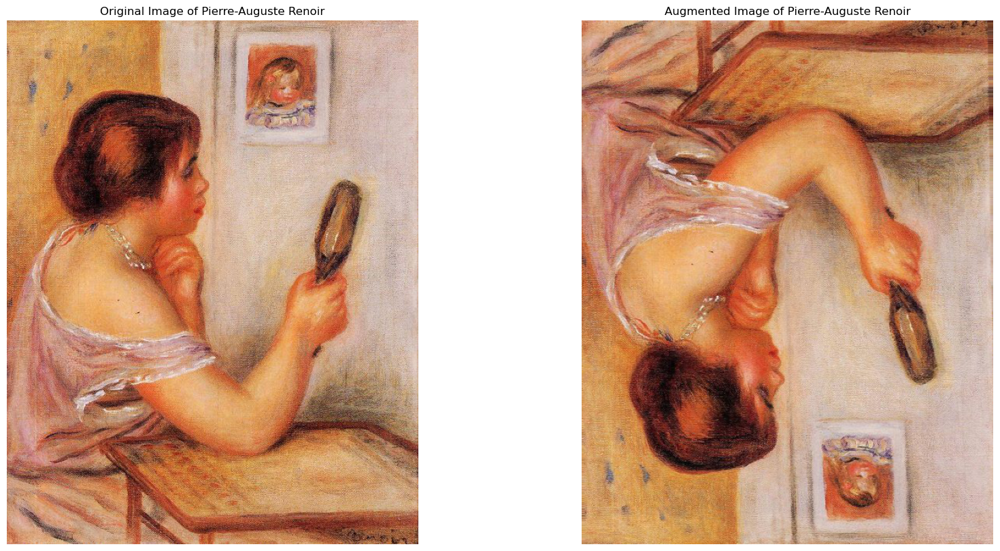

In [54]:
# Display original and augmented image
fig, axes = plt.subplots(1, 2, figsize=(20,10))

random_artist = random.choice(class_names)
random_image = random.choice(os.listdir(os.path.join(data_dir, random_artist)))
random_image_file = os.path.join(data_dir, random_artist, random_image)

# Original image
image = plt.imread(random_image_file)
axes[0].imshow(image)
axes[0].set_title("Original Image of " + random_artist.replace('_', ' '))
axes[0].axis('off')

# Transformed image
aug_image = train_datagen.random_transform(image)
axes[1].imshow(aug_image)
axes[1].set_title("Augmented Image of " + random_artist.replace('_', ' '))
axes[1].axis('off')

plt.show()


# Build ResNet50 Model (Fine-Tuned)

In [55]:
# Load pre-trained ResNet50 model
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=input_shape)

# Make all layers trainable
for layer in base_model.layers:
    layer.trainable = True

# Add classification layers
X = base_model.output
X = Flatten()(X)

X = Dense(512, kernel_initializer="he_uniform")(X)
X = BatchNormalization()(X)
X = Activation("relu")(X)

X = Dense(16, kernel_initializer="he_uniform")(X)
X = BatchNormalization()(X)
X = Activation("relu")(X)

output = Dense(n_classes, activation="softmax")(X)

# Compile the model
model = Model(inputs=base_model.input, outputs=output)

optimizer = Adam(learning_rate=0.0001)
model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 74,978,955 (286.02 MB)

 Trainable params: 74,924,779 (285.82 MB)

 Non-trainable params: 54,176 (211.62 KB)

# Train Model (Phase 1 - Train All Layers)

In [56]:
# Callbacks
early_stop = EarlyStopping(monitor="val_loss", patience=20, verbose=1, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=5, verbose=1)

n_epochs = 10

history1 = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=n_epochs,
    shuffle=True,
    verbose=1,
    callbacks=[reduce_lr],
    class_weight=class_weights
)

/opt/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 733s 3s/step - accuracy: 0.3708 - loss: 1.7978 - val_accuracy: 0.0596 - val_loss: 2.6042 - learning_rate: 1.0000e-04
Epoch 2/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 774s 4s/step - accuracy: 0.7179 - loss: 1.1724 - val_accuracy: 0.0959 - val_loss: 2.4665 - learning_rate: 1.0000e-04
Epoch 3/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 684s 3s/step - accuracy: 0.7852 - loss: 1.0160 - val_accuracy: 0.1322 - val_loss: 2.5027 - learning_rate: 1.0000e-04
Epoch 4/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 712s 3s/step - accuracy: 0.8417 - loss: 0.9108 - val_accuracy: 0.3076 - val_loss: 2.0914 - learning_rate: 1.0000e-04
Epoch 5/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 628s 3s/step - accuracy: 0.8781 - loss: 0.7943 - val_accuracy: 0.5251 - val_loss: 1.5668 - learning_rate: 1.0000e-04
Epoch 6/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 629s 3s/step - accuracy: 0.8846 - loss: 0.7039 - val_accuracy: 0.7661 - val_loss: 1.0160 - learning_rate: 1.0000e-04
Epoch 7/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 674s 3s/step - acc

# Train Model (Phase 2 - Freeze Deeper Layers & Fine-Tune)

In [57]:
# Freeze deeper ResNet layers
for layer in model.layers:
    layer.trainable = False
for layer in model.layers[:50]:  # Fine-tune only shallow layers
    layer.trainable = True

optimizer = Adam(learning_rate=0.0001)

model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

n_epochs = 50

history2 = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=n_epochs,
    shuffle=True,
    verbose=1,
    callbacks=[reduce_lr, early_stop],
    class_weight=class_weights
)

Epoch 1/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 536s 2s/step - accuracy: 0.9805 - loss: 0.2594 - val_accuracy: 0.8433 - val_loss: 0.6647 - learning_rate: 1.0000e-04
Epoch 2/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 507s 2s/step - accuracy: 0.9834 - loss: 0.2171 - val_accuracy: 0.8596 - val_loss: 0.6345 - learning_rate: 1.0000e-04
Epoch 3/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 533s 2s/step - accuracy: 0.9809 - loss: 0.2117 - val_accuracy: 0.8643 - val_loss: 0.5942 - learning_rate: 1.0000e-04
Epoch 4/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 518s 2s/step - accuracy: 0.9813 - loss: 0.2010 - val_accuracy: 0.8608 - val_loss: 0.6091 - learning_rate: 1.0000e-04
Epoch 5/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 280s 1s/step - accuracy: 0.9849 - loss: 0.1811 - val_accuracy: 0.8538 - val_loss: 0.6095 - learning_rate: 1.0000e-04
Epoch 6/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 287s 1s/step - accuracy: 0.9913 - loss: 0.1603 - val_accuracy: 0.8351 - val_loss: 0.6311 - learning_rate: 1.0000e-04
Epoch 7/50
216/216 ━━━━━━━━━━━━━━━━━━━━ 284s 1s/step - acc

# Evaluate the Model

In [58]:
# Evaluate on training data
train_score = model.evaluate(train_generator, verbose=1)
print(" Train Accuracy:", train_score[1])

# Evaluate on validation data
valid_score = model.evaluate(valid_generator, verbose=1)
print(" Validation Accuracy:", valid_score[1])


216/216 ━━━━━━━━━━━━━━━━━━━━ 62s 287ms/step - accuracy: 0.9958 - loss: 0.0875
 Train Accuracy: 0.9968060255050659
54/54 ━━━━━━━━━━━━━━━━━━━━ 15s 277ms/step - accuracy: 0.8923 - loss: 0.4559
 Validation Accuracy: 0.8877192735671997


# Plot Training Performance

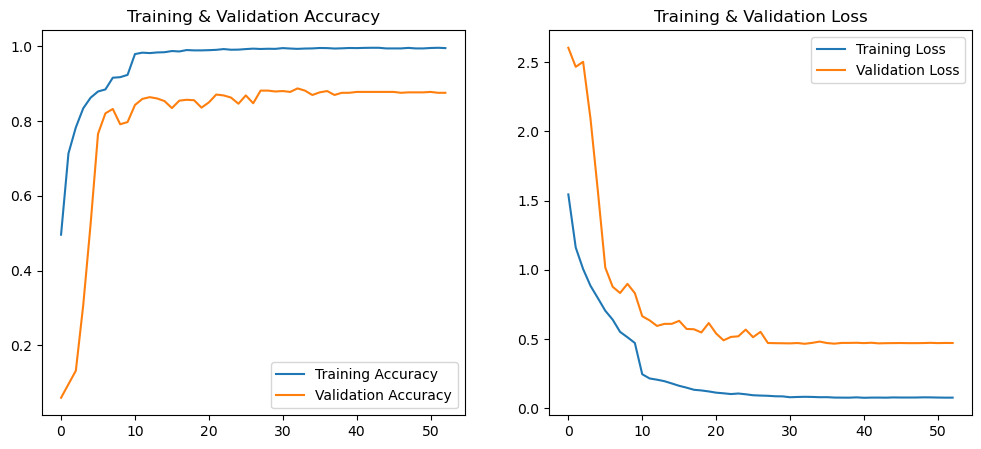

In [59]:
def plot_training(history1, history2):
    history = {
        'loss': history1.history['loss'] + history2.history['loss'],
        'acc': history1.history['accuracy'] + history2.history['accuracy'],
        'val_loss': history1.history['val_loss'] + history2.history['val_loss'],
        'val_acc': history1.history['val_accuracy'] + history2.history['val_accuracy']
    }

    plt.figure(figsize=(12, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history['acc'], label="Training Accuracy")
    plt.plot(history['val_acc'], label="Validation Accuracy")
    plt.title("Training & Validation Accuracy")
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history['loss'], label="Training Loss")
    plt.plot(history['val_loss'], label="Validation Loss")
    plt.title("Training & Validation Loss")
    plt.legend()

    plt.show()

plot_training(history1, history2)


## Confusion Matrix. Look at the style of the artists which the model thinks are almost similar.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

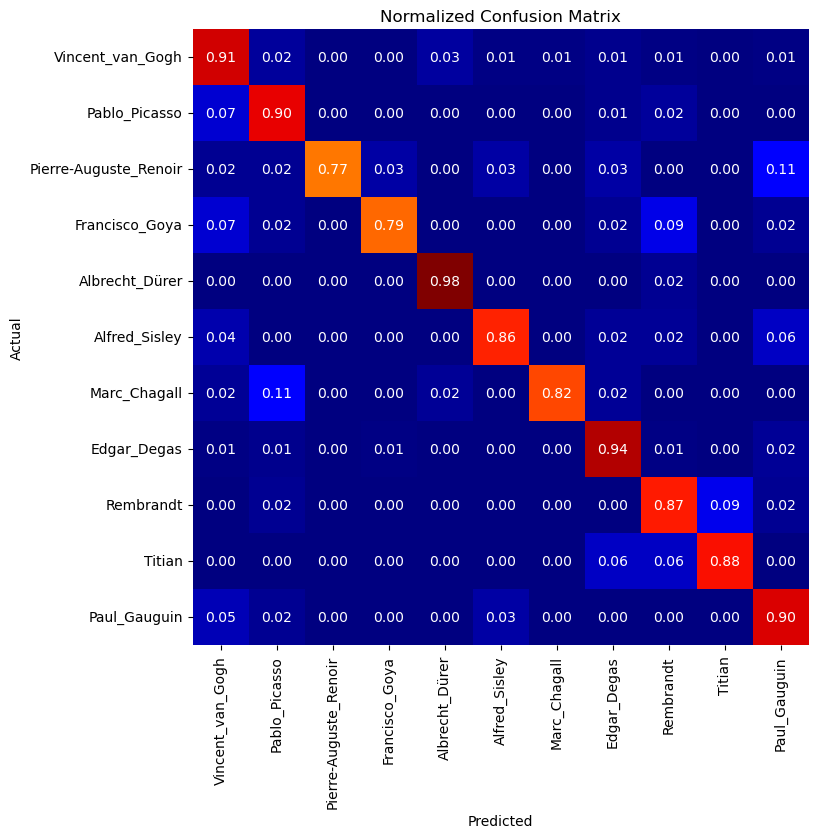

Classification Report:
                       precision    recall  f1-score   support

     Vincent_van_Gogh       0.90      0.91      0.90       170
        Pablo_Picasso       0.84      0.90      0.87        86
Pierre-Auguste_Renoir       1.00      0.77      0.87        65
       Francisco_Goya       0.94      0.79      0.85        56
       Albrecht_Dürer       0.91      0.98      0.95        64
        Alfred_Sisley       0.90      0.86      0.88        50
         Marc_Chagall       0.97      0.82      0.89        45
          Edgar_Degas       0.92      0.94      0.93       138
            Rembrandt       0.77      0.87      0.81        53
               Titian       0.90      0.88      0.89        49
         Paul_Gauguin       0.78      0.90      0.84        63

             accuracy                           0.89       839
            macro avg       0.89      0.87      0.88       839
         weighted avg       0.89      0.89      0.89       839



In [75]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Define STEP_SIZE_VALID if not already defined:
STEP_SIZE_VALID = valid_generator.n // valid_generator.batch_size

def show_confusion_matrix(model, valid_generator, steps, n_classes, tick_labels):
    y_pred, y_true = [], []
    
    # Loop over the specified number of validation steps
    for i in range(steps):
        X_batch, y_batch = next(valid_generator)
        preds = model.predict(X_batch)
        y_pred.append(preds)
        y_true.append(y_batch)
    
    # Flatten predictions and true labels into one-dimensional arrays
    y_pred = np.concatenate(y_pred, axis=0)
    y_true = np.concatenate(y_true, axis=0)
    
    # Convert one-hot encoded labels to class indices
    y_pred_class = np.argmax(y_pred, axis=1)
    y_true_class = np.argmax(y_true, axis=1)
    
    # Compute the confusion matrix
    cm = confusion_matrix(y_true_class, y_pred_class, labels=np.arange(n_classes))
    # Normalize the confusion matrix row-wise
    cm_normalized = cm.astype('float') / cm.sum(axis=1, keepdims=True)
    
    # Plot the normalized confusion matrix
    plt.figure(figsize=(8, 8))
    sns.heatmap(cm_normalized, annot=True, fmt=".2f", square=True, cbar=False,
                cmap=plt.cm.jet, xticklabels=tick_labels, yticklabels=tick_labels)
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.title("Normalized Confusion Matrix")
    plt.show()
    
    # Print the classification report
    print("Classification Report:")
    print(classification_report(y_true_class, y_pred_class, target_names=tick_labels))

# Call the function using your trained model and validation generator
show_confusion_matrix(model, valid_generator, STEP_SIZE_VALID, n_classes, class_names)


# Make Prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


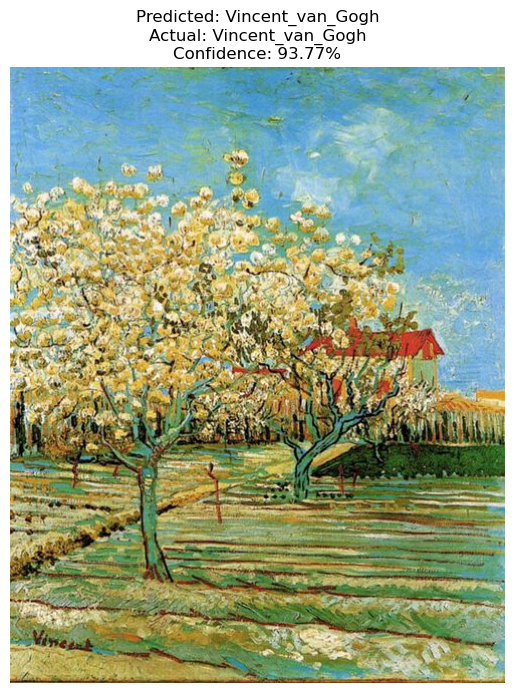

In [66]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image as keras_image  # Alias to avoid conflict
# Ensure class_names, model, and data_dir_filtered are defined from your training pipeline

# Example definitions (update these paths and variables as per your environment):
# data_dir_filtered = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/filtered_resized"
# img_size = (224, 224)
# class_names = list(train_generator.class_indices.keys())  # Or your manually defined list

# For demonstration, we assume these are already set:
# data_dir_filtered, img_size, class_names, and model

# Select a random artist from the class_names list
random_artist = random.choice(class_names)

# Build the path to that artist's folder in your filtered directory
artist_folder = os.path.join(data_dir_filtered, random_artist)

# Choose a random image from the selected artist's folder
random_image = random.choice(os.listdir(artist_folder))
random_image_file = os.path.join(artist_folder, random_image)

# Load the image using Keras (using the alias) and resize it to img_size
test_image = keras_image.load_img(random_image_file, target_size=img_size)
test_image = keras_image.img_to_array(test_image) / 255.0  # Normalize to [0,1]
test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension

# Predict the artist using your trained model
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.max(prediction) * 100

# Display the image and overlay the prediction results
plt.figure(figsize=(8, 8))
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


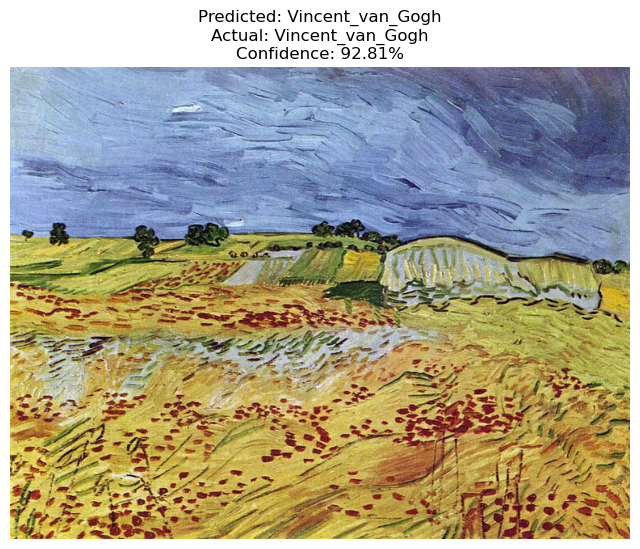

In [67]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image as keras_image  # Alias to avoid conflict
# Ensure class_names, model, and data_dir_filtered are defined from your training pipeline

# Example definitions (update these paths and variables as per your environment):
# data_dir_filtered = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/filtered_resized"
# img_size = (224, 224)
# class_names = list(train_generator.class_indices.keys())  # Or your manually defined list

# For demonstration, we assume these are already set:
# data_dir_filtered, img_size, class_names, and model

# Select a random artist from the class_names list
random_artist = random.choice(class_names)

# Build the path to that artist's folder in your filtered directory
artist_folder = os.path.join(data_dir_filtered, random_artist)

# Choose a random image from the selected artist's folder
random_image = random.choice(os.listdir(artist_folder))
random_image_file = os.path.join(artist_folder, random_image)

# Load the image using Keras (using the alias) and resize it to img_size
test_image = keras_image.load_img(random_image_file, target_size=img_size)
test_image = keras_image.img_to_array(test_image) / 255.0  # Normalize to [0,1]
test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension

# Predict the artist using your trained model
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.max(prediction) * 100

# Display the image and overlay the prediction results
plt.figure(figsize=(8, 8))
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


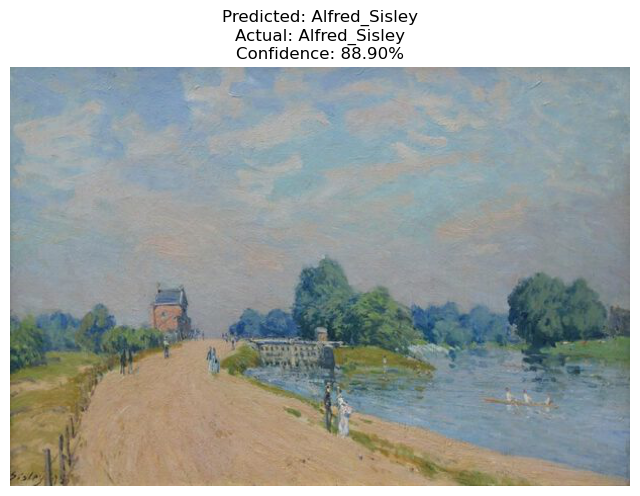

In [68]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image as keras_image  # Alias to avoid conflict
# Ensure class_names, model, and data_dir_filtered are defined from your training pipeline

# Example definitions (update these paths and variables as per your environment):
# data_dir_filtered = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/filtered_resized"
# img_size = (224, 224)
# class_names = list(train_generator.class_indices.keys())  # Or your manually defined list

# For demonstration, we assume these are already set:
# data_dir_filtered, img_size, class_names, and model

# Select a random artist from the class_names list
random_artist = random.choice(class_names)

# Build the path to that artist's folder in your filtered directory
artist_folder = os.path.join(data_dir_filtered, random_artist)

# Choose a random image from the selected artist's folder
random_image = random.choice(os.listdir(artist_folder))
random_image_file = os.path.join(artist_folder, random_image)

# Load the image using Keras (using the alias) and resize it to img_size
test_image = keras_image.load_img(random_image_file, target_size=img_size)
test_image = keras_image.img_to_array(test_image) / 255.0  # Normalize to [0,1]
test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension

# Predict the artist using your trained model
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.max(prediction) * 100

# Display the image and overlay the prediction results
plt.figure(figsize=(8, 8))
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


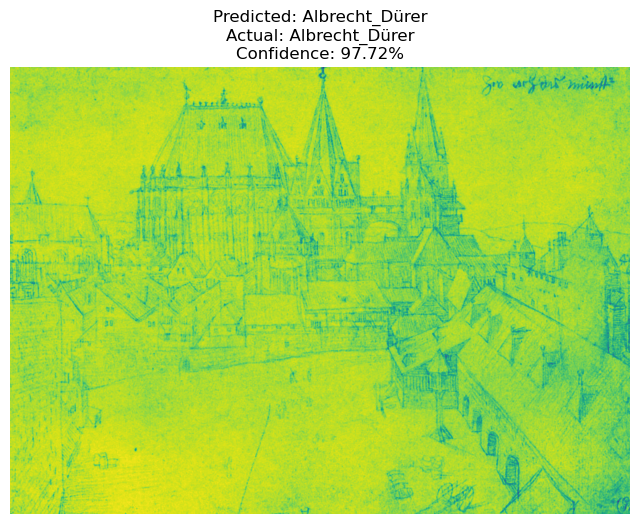

In [69]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image as keras_image  # Alias to avoid conflict
# Ensure class_names, model, and data_dir_filtered are defined from your training pipeline

# Example definitions (update these paths and variables as per your environment):
# data_dir_filtered = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/filtered_resized"
# img_size = (224, 224)
# class_names = list(train_generator.class_indices.keys())  # Or your manually defined list

# For demonstration, we assume these are already set:
# data_dir_filtered, img_size, class_names, and model

# Select a random artist from the class_names list
random_artist = random.choice(class_names)

# Build the path to that artist's folder in your filtered directory
artist_folder = os.path.join(data_dir_filtered, random_artist)

# Choose a random image from the selected artist's folder
random_image = random.choice(os.listdir(artist_folder))
random_image_file = os.path.join(artist_folder, random_image)

# Load the image using Keras (using the alias) and resize it to img_size
test_image = keras_image.load_img(random_image_file, target_size=img_size)
test_image = keras_image.img_to_array(test_image) / 255.0  # Normalize to [0,1]
test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension

# Predict the artist using your trained model
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.max(prediction) * 100

# Display the image and overlay the prediction results
plt.figure(figsize=(8, 8))
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


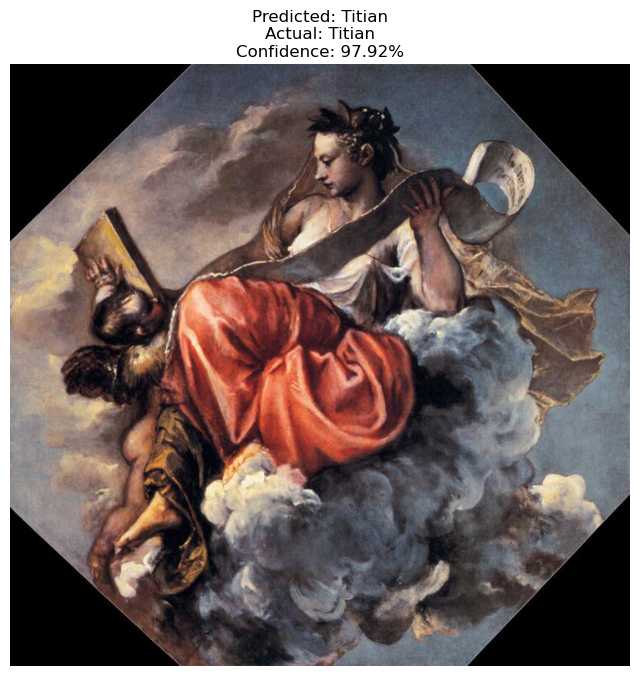

In [70]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image as keras_image  # Alias to avoid conflict
# Ensure class_names, model, and data_dir_filtered are defined from your training pipeline

# Example definitions (update these paths and variables as per your environment):
# data_dir_filtered = "/Users/kavyaemani/Winter_2025/Deep Learning/Project/filtered_resized"
# img_size = (224, 224)
# class_names = list(train_generator.class_indices.keys())  # Or your manually defined list

# For demonstration, we assume these are already set:
# data_dir_filtered, img_size, class_names, and model

# Select a random artist from the class_names list
random_artist = random.choice(class_names)

# Build the path to that artist's folder in your filtered directory
artist_folder = os.path.join(data_dir_filtered, random_artist)

# Choose a random image from the selected artist's folder
random_image = random.choice(os.listdir(artist_folder))
random_image_file = os.path.join(artist_folder, random_image)

# Load the image using Keras (using the alias) and resize it to img_size
test_image = keras_image.load_img(random_image_file, target_size=img_size)
test_image = keras_image.img_to_array(test_image) / 255.0  # Normalize to [0,1]
test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension

# Predict the artist using your trained model
prediction = model.predict(test_image)
predicted_idx = np.argmax(prediction)
prediction_probability = np.max(prediction) * 100

# Display the image and overlay the prediction results
plt.figure(figsize=(8, 8))
plt.imshow(plt.imread(random_image_file))
plt.title(f"Predicted: {class_names[predicted_idx]}\nActual: {random_artist}\nConfidence: {prediction_probability:.2f}%")
plt.axis("off")
plt.show()
